In [1]:
# import logging
import os
import re
from pathlib import Path
from collections import Counter

import matplotlib.pyplot as plt
import numpy
import torch
import yaml

In [2]:
%load_ext autoreload

In [3]:
%autoreload 2

In [4]:
from mushroom.mushroom import Mushroom

In [5]:
section_config = yaml.safe_load(
    open('/data/estorrs/mushroom/data/examples/HT397B1_v1/registration/registered/mushroom_inputs.yaml')
)
section_config

[{'data': [{'dtype': 'he',
    'filepath': '/data/estorrs/mushroom/data/examples/HT397B1_v1/registration/registered/s0_he.tif'},
   {'dtype': 'visium',
    'filepath': '/data/estorrs/mushroom/data/examples/HT397B1_v1/registration/registered/s0_visium.h5ad'}],
  'id': 's0',
  'position': 0},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/examples/HT397B1_v1/registration/registered/s1_multiplex.ome.tiff'}],
  'id': 's1',
  'position': 1},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/data/estorrs/mushroom/data/examples/HT397B1_v1/registration/registered/s2_multiplex.ome.tiff'}],
  'id': 's2',
  'position': 11},
 {'data': [{'dtype': 'he',
    'filepath': '/data/estorrs/mushroom/data/examples/HT397B1_v1/registration/registered/s3_he.tif'},
   {'dtype': 'visium',
    'filepath': '/data/estorrs/mushroom/data/examples/HT397B1_v1/registration/registered/s3_visium.h5ad'}],
  'id': 's3',
  'position': 20},
 {'data': [{'dtype': 'multiplex',
    'filepath': '/

In [35]:
from mushroom.data.visium import get_common_channels, adata_from_visium

In [36]:
fps = [entry['filepath'] for item in section_config for entry in item['data'] if entry['dtype']=='visium']
fps

['/data/estorrs/mushroom/data/examples/HT397B1_v1/registration/registered/s0_visium.h5ad',
 '/data/estorrs/mushroom/data/examples/HT397B1_v1/registration/registered/s3_visium.h5ad']

In [37]:
channels = get_common_channels(fps, channel_mapping=None, pct_expression=.1)

In [9]:
len(channels)

7121

In [10]:
import squidpy as sq

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/geopandas/_compat.py:124: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/spatialdata/__init__.py:9: UserWarning: Geopandas was set to use PyGEOS, changing to shapely 2.0 with:

	geopandas.options.use_pygeos = True

If you intended to use PyGEOS, set the option to False.
  _check_geopandas_using_shapely()


In [38]:
a = adata_from_visium(fps[0], normalize=True)
a = a[:, channels]
a

AnnData object with n_obs × n_vars = 3058 × 17943
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial', 'log1p'
    obsm: 'spatial'

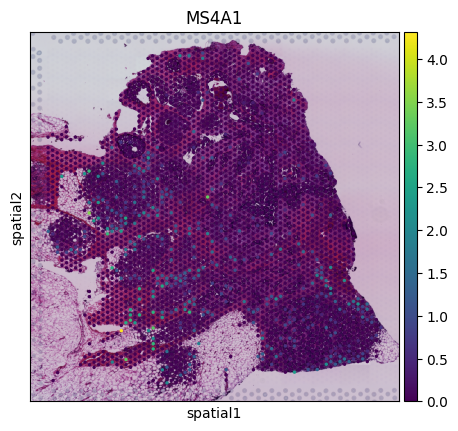

In [51]:
import scanpy as sc
sc.pl.spatial(a, color=['MS4A1'])

In [12]:
sq.gr.spatial_neighbors(a)

In [13]:
sq.gr.sepal(a, 6)

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/anndata/_core/anndata.py:1113: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(df_full[k]):


  0%|          | 0/7121 [00:00<?, ?/s]

In [15]:
a.uns['sepal_score']

,sepal_score
APOC1,2.100
SBSPON,1.977
COL11A1,1.881
ASPN,1.774
KLHL1,1.678
...,...
HDHD2,0.014
GTF3C4,0.014
SORT1,0.014
SPATA17,0.014


/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


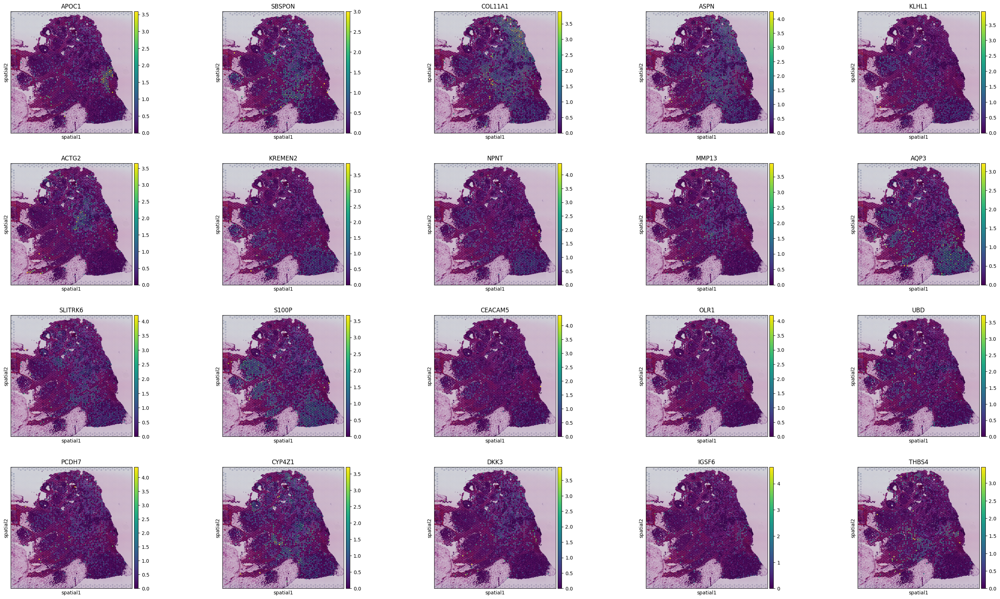

In [42]:
channels = a.uns['sepal_score'].index.to_list()[:100]
sc.pl.spatial(a, color=channels[:20], ncols=5)

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


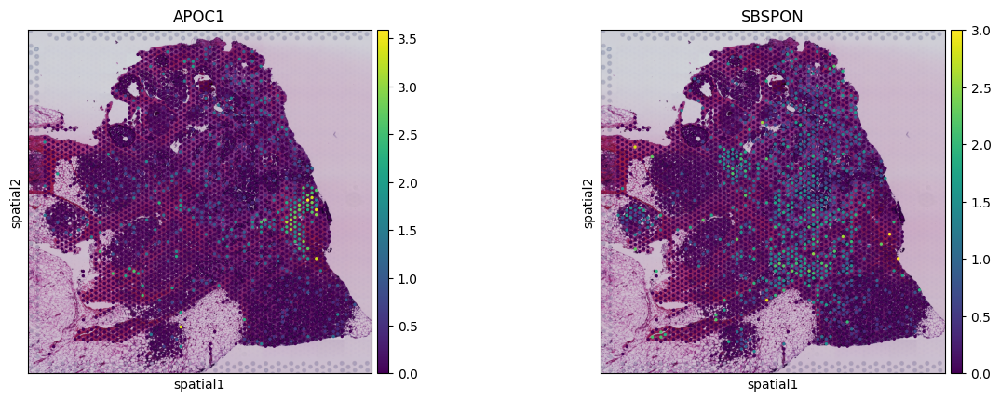

In [44]:
import scanpy as sc
logger = logging.getLogger('pandas')
logger.setLevel(logging.CRITICAL)
sc.pl.spatial(a, color=['APOC1', 'SBSPON'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


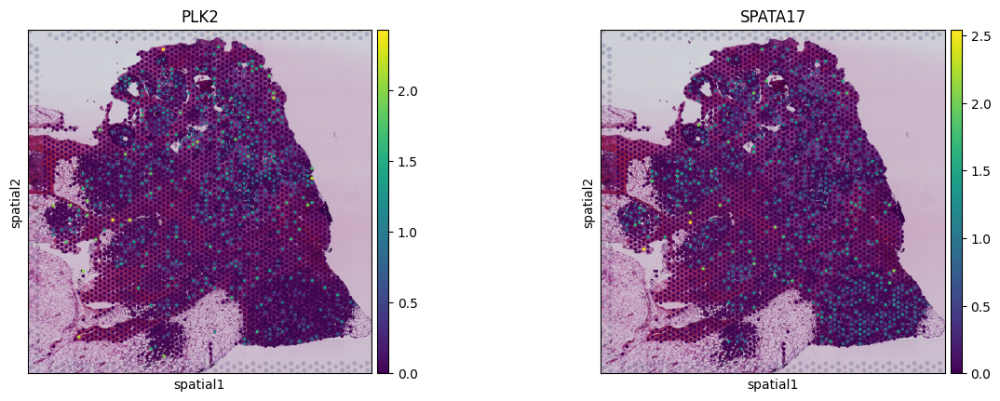

In [18]:
sc.pl.spatial(a, color=['PLK2', 'SPATA17'])

/data/estorrs/miniconda3/envs/mushroom/lib/python3.9/site-packages/scanpy/plotting/_tools/scatterplots.py:1207: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if not is_categorical_dtype(values):


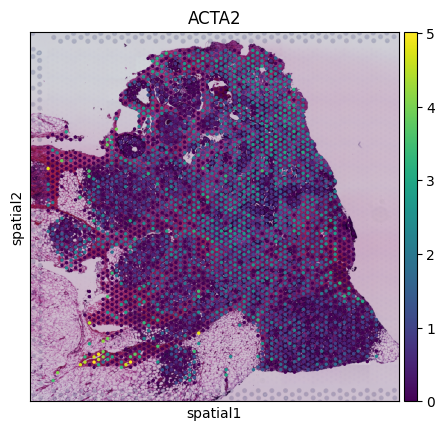

In [19]:
sc.pl.spatial(a, color=['ACTA2'])

In [33]:
a

NameError: name 'a' is not defined

## train multiplex

In [6]:
out_dir = '/data/estorrs/mushroom/data/examples/HT397B1_v1/mushroom_outputs/multiplex'
chkpt_dir = os.path.join(out_dir, 'chkpts')
Path(chkpt_dir).mkdir(parents=True, exist_ok=True)

In [7]:
# only relavent for dinglab data since our channel names are all over the place
# will remove for official example
official_to_options = {
    'Pan-Cytokeratin': ['Pan-Cytokeratin', 'Pan-CK', 'Pan-CK (D)', 'PanCK (D)'],
    'E-cadherin': ['E-cadherin'],
    'CD45': ['CD45 (D)', 'CD45', 'CD45-(D)'],
    'CD45RO': ['CD45RO'],
    'CD45RA': ['CD45RA'],
    'CD8': ['CD8', 'CD8a'],
    'DAPI': ['DAPI'],
    'CD4': ['CD4', 'CD4 (D)'],
    'CD3e': ['CD3e', 'CD3'],
    'Vimentin': ['Vimentin-(D)', 'Vimentin', 'Vimentin (D)'],
    'SMA': ['SMA-(D)', 'SMA', 'SMA (D)', 'a-SMA (D)'],
    'CD31': ['CD31', 'CD31-(D)', 'CD31 (D)'],
    'CD20': ['CD20-(D)', 'CD20', 'CD20 (D)', 'CD20-Akoya'],
    'CD68': ['CD68', 'CD68 (D)', 'CD68-(D)'],
    'CD163': ['CD163'],
    'FOXP3': ['FoxP3', 'FOXP3', 'Foxp3'],
    'cKit': ['cKIT (D)', 'cKit (D)', 'cKit', 'cKIT', 'cKIT-(D)'],
    'MGP': ['MGP', 'MGP (D)', 'MGP-(D)'],
    'CD36': ['CD36-(D)', 'CD36'],
    'PR': ['PR', 'PR-(D)', 'PR (D)'],
    'ER': ['ER', 'ER-(D)', 'ER (D)'],
    'P21': ['P21', 'P21-(D)', 'P21-(D)', 'P21 (D)'],
    'P16': ['P16-(D)'],
    'CK5': ['Keratin 5', 'KRT5'],
    'TFF1': ['TFF1', 'TFF1-(D)', 'TFF1 (D)'],
    'beta-integrin': ['beta-integrin', 'beta3-integrin'],
    'CK14': ['CK14', 'Keratin 14', 'CK14 (D)'],
    'CK17': ['CK17', 'CK17 (D)', 'CK17-(D)', 'Keratin 17'],
    'CK19': ['CK19', 'CK19 (D)', 'CK19-(D)'],
    'CD11b': ['CD11b', 'CD11b (D)', 'CD11b-(D)'],
    'GATA3': ['GATA3', 'GATA3-(D)', 'GATA3 (D)'],
    'PLAT/tPA': ['PLAT/tPA', 'PLAT/tPA (D)'],
    'COX6c': ['COX6c (D)'],
    'Her2': ['Her2', 'Her2 (D)'],
    'Bap1': ['Bap1 (D)'],
    'GLUT1': ['Glut1', 'GLUT1', 'GLUT1-(D)', 'GLUT1 (D)'],
    'CD11c': ['CD11c'],
    'HLA-DR': ['HLA-DR'],
    'Ki67': ['Ki67', 'KI67'],
    'Podoplanin': ['Podoplanin', 'PDPN', 'Podoplanin (D)'],
    'CTLA4': ['CTLA4', 'CTLA4 (D)', 'CTLA4-(D)'],
    'SLC39A6': ['SLC39A6'],
    'BCA1': ['BCA1'],
    'BCAL': ['BCAL'],
    'TUBB3': ['TUBB3', 'TUBB3 (D)'],
    'PTPRZ1': ['PTPRZ1', 'PTPRZ1 (D)'],
    'HIF1A': ['HIF1a', 'HIF1a (D)', 'HIF1A'],
    'PAI1': ['PAI1', 'PAI1-(D)'],
    'GFAP': ['GFAP', 'GFAP (D)'],
    'VEGFA': ['VEGFA', 'VEGFA (D)'],
    'IBA1': ['IBA1', 'IBA1 (D)'],
    'OLIG2': ['OLIG2', 'OLIG2 (D)'],
    'FN1': ['FN1', 'FN1 (D)'],
    'a-Amylase': ['a-Amylase'],
    'Hep-Par-1': ['Hep-Par-1 (D)'],
    'Granzyme-B': ['Granzyme B'],
    'TCF-1': ['TCF-1'],
    'CD39': ['CD39'],
    'PD1': ['PD-1'],
    'PDL1': ['PD-L1'],
    'Histone-H3-Pho': ['Histone H3 Pho'],
    'Maspin': ['Maspin'],
    'MMP9': ['MMP9'],
    'CD44': ['CD44'],
    'CD107A': ['CD107a'],
    'FGFR3': ['FGFR3'],
    'CD138': ['CD138'],
    'MLPH': ['MLPH'],
    'P63': ['P63'],
    'GP2': ['GP2'],
    'COX2': ['COX2'],
    'Lyve-1': ['Lyve-1'],
}
channel_mapping = {v:k for k, vs in official_to_options.items() for v in vs}

In [8]:
mushroom_config = {
    'dtype': 'multiplex',
    'sections': section_config,
    'chkpt_filepath': None,
    'sae_kwargs': {
        'size': 256,
        'patch_size': 32,
        'triplet_scaler': 1.,
        'recon_scaler': 1.
    },
    'learner_kwargs': {
        'scale': .1,
        'num_workers': 10,
        'channel_mapping': channel_mapping
    },
    'train_kwargs': {
        'num_iters': 200,
        'lr': 1e-4,
        'log_every': 10,
        'save_every': 100,
        'save_dir': chkpt_dir       
    },
    'cluster_kwargs': {
        'num_clusters': 20,
        'mask_background': True,
        'margin': .05,
#         'background_channels': ['DAPI'],
        'span_all_sections': True
    }
}

In [9]:
mushroom = Mushroom.from_config(mushroom_config)

INFO:root:using device: cuda
INFO:root:generating inputs for multiplex tissue sections
INFO:root:using 24 channels
INFO:root:4 sections detected: ['s1', 's2', 's4', 's5']
INFO:root:processing sections
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:no background channel detected, defaulting to mean of all channels


In [10]:
mushroom.train()

INFO:root:iteration 0: {'overall_loss': tensor(1.8931, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.4457, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.4474, device='cuda:0', grad_fn=<AddBackward0>)}
INFO:root:saving checkpoint to /data/estorrs/mushroom/data/examples/HT397B1_v1/mushroom_outputs/multiplex/chkpts/0iter.pt
INFO:root:iteration 10: {'overall_loss': tensor(1.4992, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.3775, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.1217, device='cuda:0', grad_fn=<AddBackward0>)}
INFO:root:iteration 20: {'overall_loss': tensor(1.1910, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1310, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0600, device='cuda:0', grad_fn=<AddBackward0>)}
INFO:root:iteration 30: {'overall_loss': tensor(1.2672, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.1924, device='cuda:0', grad_fn=<

In [11]:
mushroom.embed_sections()

DEBUG:matplotlib.pyplot:Loaded backend module://matplotlib_inline.backend_inline version unknown.
DEBUG:matplotlib.pyplot:Loaded backend module://matplotlib_inline.backend_inline version unknown.
DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=10.0.
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneral.ttf', name='STIXGeneral', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/minicon

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/STIXSizFiveSymReg.ttf', name='STIXSizeFiveSym', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/cmtt10.ttf', name='cmtt10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneralItalic.ttf', name='STIXGeneral', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/usr/share/fonts/truetype/dejavu/DejaVuSerif.ttf', name='DejaVu Serif', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf', name='DejaVu Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 0.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/usr/share/fonts/truetype/lyx/msbm10.ttf', name='msbm10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/usr/share/fonts/truetype/lyx/esint10.ttf', name='esint10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/usr/share/fonts/truetype/ttf-bitstream-vera/VeraMoBd.ttf', name='

array([[<Axes: title={'center': 's1'}, ylabel='predicted'>,
        <Axes: title={'center': 's2'}>, <Axes: title={'center': 's4'}>,
        <Axes: title={'center': 's5'}>],
       [<Axes: ylabel='true'>, <Axes: >, <Axes: >, <Axes: >]],
      dtype=object)

DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=12.0.
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneral.ttf', name='STIXGeneral', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneralBolIta.ttf', name='STIXGeneral', style='italic', variant='normal', weight=700, stretch='normal', size='scalable')) = 11.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/cmr10.ttf', name='cmr10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05


DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/cmtt10.ttf', name='cmtt10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneralItalic.ttf', name='STIXGeneral', style='italic', variant='normal', weight=400, stretch='normal', size='scalable')) = 11.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site-packages/matplotlib/mpl-data/fonts/ttf/STIXGeneralBol.ttf', name='STIXGeneral', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site

DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/usr/share/fonts/truetype/dejavu/DejaVuSans.ttf', name='DejaVu Sans', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 0.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/usr/share/fonts/truetype/lyx/msbm10.ttf', name='msbm10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/usr/share/fonts/truetype/lyx/esint10.ttf', name='esint10', style='normal', variant='normal', weight=400, stretch='normal', size='scalable')) = 10.05
DEBUG:matplotlib.font_manager:findfont: score(FontEntry(fname='/usr/share/fonts/truetype/ttf-bitstream-vera/VeraMoBd.ttf', name='Bitstream Vera Sans Mono', style='normal', variant='normal', weight=700, stretch='normal', size='scalable')) = 10.335
DEBUG:matplotlib.font_manager:findfont: Matching sans\-serif:style=normal:variant=normal:weight=normal:stre

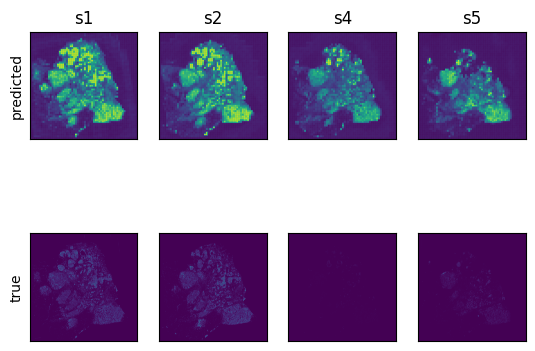

In [12]:
mushroom.display_predicted_pixels(channel='Pan-Cytokeratin')

In [80]:
mushroom.recon_imgs.shape, mushroom.true_imgs.shape

(torch.Size([4, 24, 1920, 1920]), torch.Size([4, 24, 1920, 1920]))

In [29]:
mushroom.cluster_sections(margin=.27)

INFO:root:no background channel detected, defaulting to mean of all channels


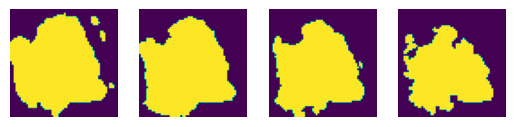

In [30]:
mushroom.clusterer.display_section_masks()

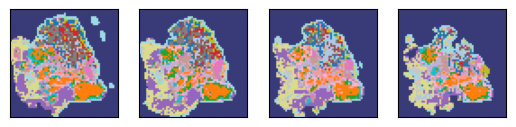

In [31]:
mushroom.clusterer.display_cluster_ids(mushroom.cluster_ids)

In [35]:
import seaborn as sns
sns.color_palette('tab20')

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.17254901960784313, 0.6274509803921569, 0.17254901960784313),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.5803921568627451, 0.403921568627451, 0.7411764705882353),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.4980392156862745, 0.4980392156862745, 0.4980392156862745),
 (0.7803921568627451, 0.7803921568627451, 0.7803921568627451),
 (0.7372549019607844, 0.7411764705882353, 0.13333333333333333),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745)]

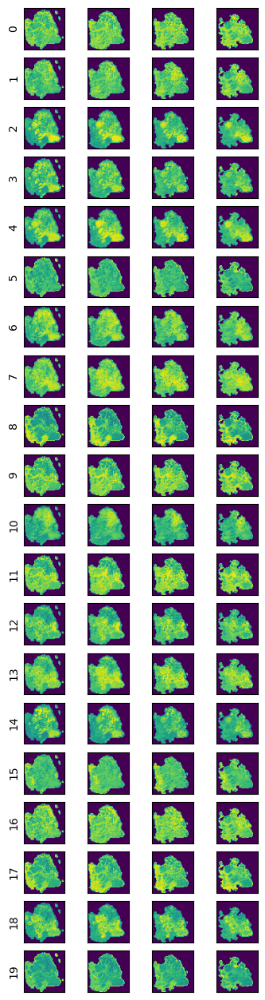

In [32]:
mushroom.clusterer.display_distances(mushroom.dists, figsize=(4, 16))

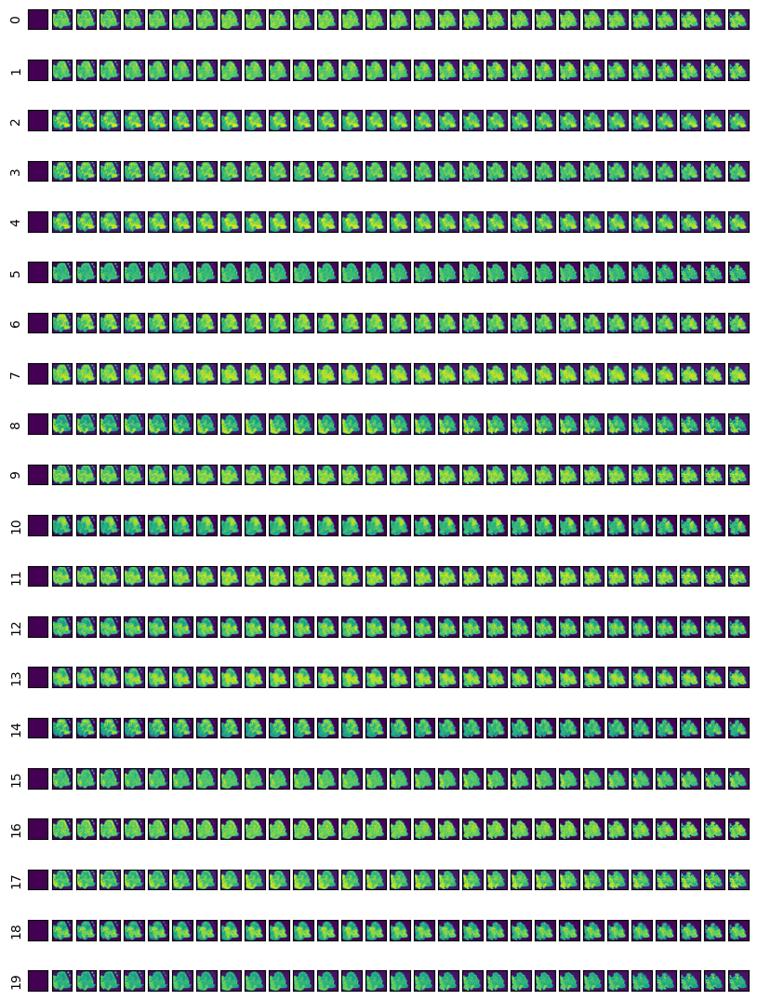

In [33]:
mushroom.clusterer.display_distances(mushroom.dists_volume, figsize=(10, 14))

In [255]:
mushroom.cluster_sections(recluster=False)

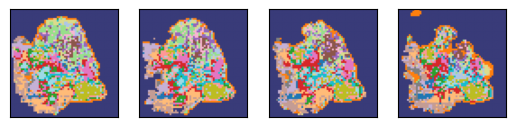

In [256]:
mushroom.clusterer.display_cluster_ids(mushroom.cluster_ids)

In [36]:
mushroom.save_config(os.path.join(out_dir, 'config.yaml'))

In [37]:
mushroom.save_outputs(os.path.join(out_dir, 'outputs.pt'))

In [8]:
loaded_mushroom = Mushroom.from_config(os.path.join(out_dir, 'config.yaml'))

INFO:root:using device: cuda
INFO:root:generating inputs for multiplex tissue sections
INFO:root:using 24 channels
INFO:root:4 sections detected: ['s1', 's2', 's4', 's5']
INFO:root:processing sections
INFO:root:generating training dataset
INFO:root:generating inference dataset


In [289]:
loaded_mushroom.embed_sections()

In [290]:
loaded_mushroom.cluster_sections(recluster=False)

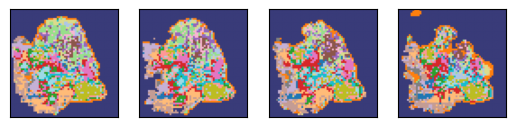

In [292]:
loaded_mushroom.clusterer.display_cluster_ids(loaded_mushroom.cluster_ids)

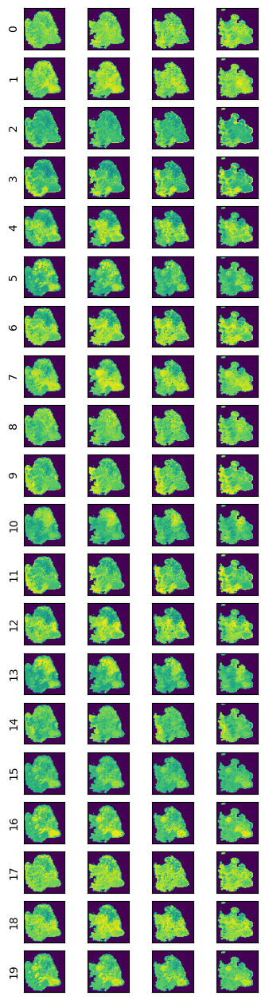

In [293]:
loaded_mushroom.clusterer.display_distances(loaded_mushroom.dists, figsize=(4, 16))

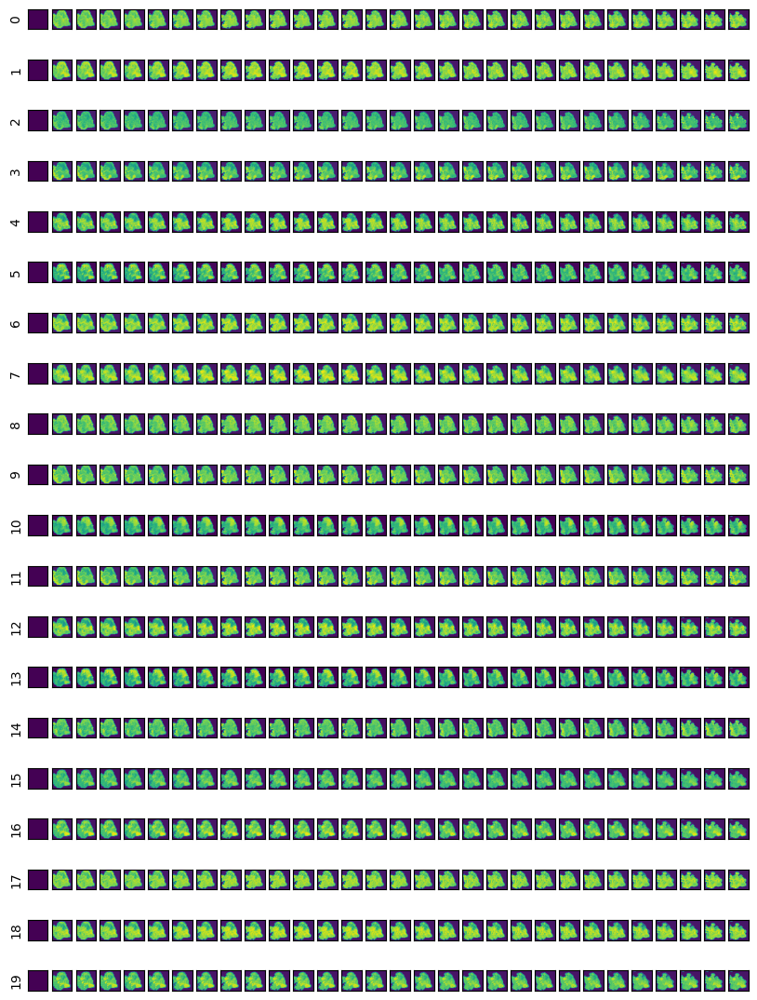

In [294]:
loaded_mushroom.clusterer.display_distances(loaded_mushroom.dists_volume, figsize=(10, 14))

## visium

In [12]:
channels = [
    'APOC1',
    'SBSPON',
    'COL11A1',
    'ASPN',
    'KLHL1',
    'ACTG2',
    'KREMEN2',
    'NPNT',
    'MMP13',
    'AQP3',
    'SLITRK6',
    'S100P',
    'CEACAM5',
    'OLR1',
    'UBD',
    'PCDH7',
    'CYP4Z1',
    'DKK3',
    'IGSF6',
    'THBS4',
    'MS4A6A',
    'BMPR1B',
    'CNIH4',
    'PSMB9',
    'GREB1L',
    'CCNO',
    'SYT13',
    'TSPAN1',
    'IL7R',
    'AIF1',
    'GMFG',
    'MX1',
    'CHST11',
    'TNFRSF12A',
    'GXYLT2',
    'MMP9',
    'EGR2',
    'ACP5',
    'RAB26',
    'DTL',
    'PTDSS2',
    'DDX58',
    'PNPLA3',
    'CDK1',
    'STC2',
    'PLEKHO2',
    'CLEC2B',
    'SHROOM1',
    'ITGBL1',
    'S100A8',
    'ATAD3C',
    'MS4A7',
    'CORO2A',
    'SAMD12',
    'DNAAF1',
    'PEPD',
    'IFT88',
    'CCNB1',
    'IGLC1',
    'VGLL3',
    'MAK16',
    'ZNF117',
    'STEAP1',
    'PRR7',
    'CYFIP2',
    'CCNG2',
    'TSPYL5',
    'FCGR2A',
    'MB',
    'FGFR2',
    'VSIR',
    'RP1',
    'LAIR1',
    'FOSB',
    'GFRA1',
    'ERBB4',
    'NTHL1',
    'MARVELD3',
    'EPHA1',
    'ATAT1',
    'HSPB8',
    'C5orf38',
    'KLF5',
    'EDRF1',
    'FAM114A2',
    'COL7A1',
    'GSTCD',
    'KLC4',
    'SCML1',
    'TTC13',
    'CXCL16',
    'CDK2',
    'RSPH1',
    'OGN',
    'PPME1',
    'CYP51A1',
    'RARRES1',
    'KDM6A',
    'MUC5B',
    'TAGAP'
]
channels = [
    'APOC1',
    'SBSPON',
]

In [7]:
out_dir = '/data/estorrs/mushroom/data/examples/HT397B1_v1/mushroom_outputs/visium'
chkpt_dir = os.path.join(out_dir, 'chkpts')
Path(chkpt_dir).mkdir(parents=True, exist_ok=True)

In [8]:
# mushroom_config = {
#     'dtype': 'visium',
#     'sections': section_config,
#     'chkpt_filepath': None,
#     'sae_kwargs': {
#         'size': 256,
#         'patch_size': 32,
# #         'patch_size': 
#         'triplet_scaler': 1.,
#         'recon_scaler': 1.
#     },
#     'learner_kwargs': {
#         'scale': .1,
#         'num_workers': 10,
#         'pct_expression': .02,
# #         'channel_mapping': channel_mapping
#     },
#     'train_kwargs': {
#         'num_iters': 1000,
#         'lr': 1e-4,
#         'log_every': 10,
#         'save_every': 100,
#         'save_dir': chkpt_dir       
#     },
#     'cluster_kwargs': {
#         'num_clusters': 20,
#         'mask_background': True,
#         'margin': .05,
#         'background_channels': None,
#         'span_all_sections': True
#     }
# }

In [13]:
mushroom_config = {
    'dtype': 'visium',
    'sections': section_config,
    'chkpt_filepath': None,
    'sae_kwargs': {
        'size': 256,
        'patch_size': 32,
        'triplet_scaler': 1.,
        'recon_scaler': 1.,
        'sidecar_rgb': True,
    },
    'learner_kwargs': {
        'scale': .1,
        'num_workers': 10,
        'pct_expression': .02,
        'batch_size': 32,
        'channels': channels,
#         'channel_mapping': channel_mapping
    },
    'train_kwargs': {
        'num_iters': 1000,
        'lr': 1e-4,
        'log_every': 10,
        'save_every': 100,
        'save_dir': chkpt_dir       
    },
    'cluster_kwargs': {
        'num_clusters': 20,
        'mask_background': True,
        'margin': .05,
        'background_channels': None,
        'span_all_sections': True
    }
}

In [14]:
mushroom = Mushroom.from_config(mushroom_config)

INFO:root:using device: cuda
INFO:root:generating inputs for visium tissue sections
INFO:root:using 2 channels
INFO:root:2 sections detected: ['s0', 's3']
INFO:root:processing sections
INFO:root:generating training dataset
INFO:root:generating inference dataset
INFO:root:no background channel detected, defaulting to mean of all channels


In [15]:
d = mushroom.learner.train_ds[0]
d.keys()

dict_keys(['anchor_idx', 'pos_idx', 'neg_idx', 'anchor_img', 'pos_img', 'neg_img', 'anchor_img_raw', 'pos_img_raw', 'neg_img_raw', 'anchor_rgb', 'pos_rgb', 'neg_rgb'])

In [16]:
d['anchor_img'].shape, d['anchor_img_raw'].shape, d['anchor_img'][:, 0, 0], d['anchor_img_raw'][:, 0, 0]

(torch.Size([2, 8, 8]),
 torch.Size([2, 8, 8]),
 tensor([0., 0.]),
 tensor([0, 0]))

In [17]:
d['anchor_rgb'].shape

torch.Size([3, 256, 256])

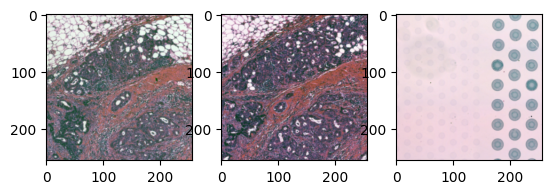

In [18]:
from einops import rearrange
fig, axs = plt.subplots(ncols=3)
anchor, pos, neg = d['anchor_rgb'], d['pos_rgb'], d['neg_rgb']
anchor, pos, neg = [rearrange(x, 'c h w -> h w c') for x in [anchor, pos, neg]]
anchor, pos, neg = [x - x.min() for x in [anchor, pos, neg]]
anchor, pos, neg = [x / x.max() for x in [anchor, pos, neg]]

axs[0].imshow(anchor)
axs[1].imshow(pos)
axs[2].imshow(neg)

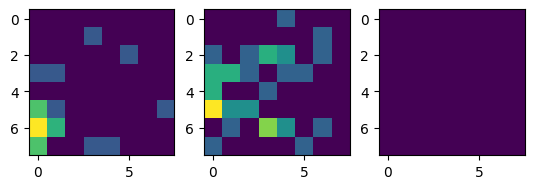

In [20]:
fig, axs = plt.subplots(ncols=3)
idx = mushroom.learner.channels.index('SBSPON')
axs[0].imshow(d['anchor_img'][idx])
axs[1].imshow(d['pos_img'][idx])
axs[2].imshow(d['neg_img'][idx])

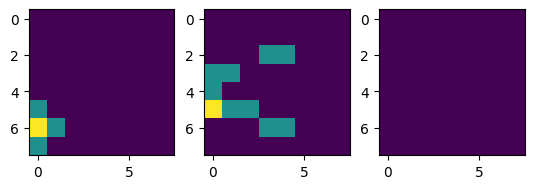

In [21]:
fig, axs = plt.subplots(ncols=3)
idx = mushroom.learner.channels.index('SBSPON')
axs[0].imshow(d['anchor_img_raw'][idx])
axs[1].imshow(d['pos_img_raw'][idx])
axs[2].imshow(d['neg_img_raw'][idx])

In [22]:
# low is ~.2

In [23]:
mushroom.train()

INFO:root:iteration 0: {'overall_loss': tensor(1.5563, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0026, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.5537, device='cuda:0', grad_fn=<AddBackward0>)}
INFO:root:saving checkpoint to /data/estorrs/mushroom/data/examples/HT397B1_v1/mushroom_outputs/visium/chkpts/0iter.pt


iteration 0: {'overall_loss': tensor(1.5563, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(1.0026, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.5537, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 10: {'overall_loss': tensor(0.7301, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.3446, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.3856, device='cuda:0', grad_fn=<AddBackward0>)}


iteration 10: {'overall_loss': tensor(0.7301, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.3446, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.3856, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 20: {'overall_loss': tensor(0.4382, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.2963, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.1419, device='cuda:0', grad_fn=<AddBackward0>)}


iteration 20: {'overall_loss': tensor(0.4382, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.2963, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.1419, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 30: {'overall_loss': tensor(0.3468, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.2821, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0647, device='cuda:0', grad_fn=<AddBackward0>)}


iteration 30: {'overall_loss': tensor(0.3468, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.2821, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0647, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 40: {'overall_loss': tensor(0.2138, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1775, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0363, device='cuda:0', grad_fn=<AddBackward0>)}


iteration 40: {'overall_loss': tensor(0.2138, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1775, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0363, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 50: {'overall_loss': tensor(0.2605, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.2288, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0317, device='cuda:0', grad_fn=<AddBackward0>)}


iteration 50: {'overall_loss': tensor(0.2605, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.2288, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0317, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 60: {'overall_loss': tensor(0.2357, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.2115, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0242, device='cuda:0', grad_fn=<AddBackward0>)}


iteration 60: {'overall_loss': tensor(0.2357, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.2115, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0242, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 70: {'overall_loss': tensor(0.1548, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1071, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0477, device='cuda:0', grad_fn=<AddBackward0>)}


iteration 70: {'overall_loss': tensor(0.1548, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1071, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0477, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 80: {'overall_loss': tensor(0.2297, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.2091, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0206, device='cuda:0', grad_fn=<AddBackward0>)}


iteration 80: {'overall_loss': tensor(0.2297, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.2091, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0206, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 90: {'overall_loss': tensor(0.1826, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1530, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0296, device='cuda:0', grad_fn=<AddBackward0>)}


iteration 90: {'overall_loss': tensor(0.1826, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1530, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0296, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 100: {'overall_loss': tensor(0.2038, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1868, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0170, device='cuda:0', grad_fn=<AddBackward0>)}
INFO:root:saving checkpoint to /data/estorrs/mushroom/data/examples/HT397B1_v1/mushroom_outputs/visium/chkpts/100iter.pt


iteration 100: {'overall_loss': tensor(0.2038, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1868, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0170, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 110: {'overall_loss': tensor(0.1858, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1730, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0128, device='cuda:0', grad_fn=<AddBackward0>)}


iteration 110: {'overall_loss': tensor(0.1858, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1730, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0128, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 120: {'overall_loss': tensor(0.2631, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.2365, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0266, device='cuda:0', grad_fn=<AddBackward0>)}


iteration 120: {'overall_loss': tensor(0.2631, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.2365, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0266, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 130: {'overall_loss': tensor(0.2241, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1816, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0425, device='cuda:0', grad_fn=<AddBackward0>)}


iteration 130: {'overall_loss': tensor(0.2241, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1816, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0425, device='cuda:0', grad_fn=<AddBackward0>)}


INFO:root:iteration 140: {'overall_loss': tensor(0.2092, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1954, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0137, device='cuda:0', grad_fn=<AddBackward0>)}


iteration 140: {'overall_loss': tensor(0.2092, device='cuda:0', grad_fn=<AddBackward0>), 'recon_loss': tensor(0.1954, device='cuda:0', grad_fn=<DivBackward0>), 'triplet_loss': tensor(0.0137, device='cuda:0', grad_fn=<AddBackward0>)}


KeyboardInterrupt: 

In [32]:
mushroom.chkpt_filepath = ''
mushroom.embed_sections()

torch.Size([32, 64, 2])
torch.Size([32, 64, 2])
torch.Size([32, 64, 2])
torch.Size([32, 64, 2])
torch.Size([32, 64, 2])
torch.Size([32, 64, 2])
torch.Size([32, 64, 2])
torch.Size([32, 64, 2])
torch.Size([32, 64, 2])
torch.Size([32, 64, 2])
torch.Size([32, 64, 2])
torch.Size([32, 64, 2])
torch.Size([32, 64, 2])
torch.Size([32, 64, 2])
torch.Size([2, 64, 2])
torch.Size([450, 2, 8, 8])
torch.Size([2, 0, 60, 60])


In [29]:
mushroom.recon_imgs

tensor([], size=(2, 0, 60, 60))

array([[<Axes: title={'center': 's0'}, ylabel='predicted'>,
        <Axes: title={'center': 's3'}>],
       [<Axes: ylabel='true'>, <Axes: >]], dtype=object)

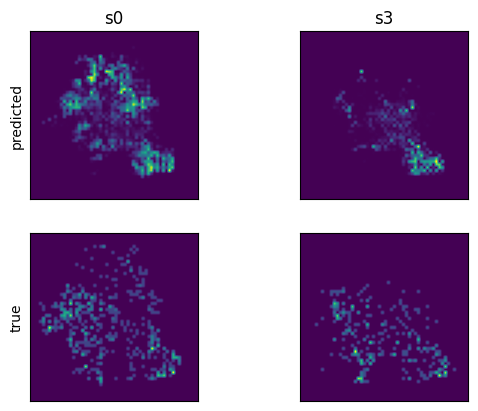

In [22]:
mushroom.display_predicted_pixels(channel='IL7R')

In [26]:
mushroom.learner.channels

['APOC1', 'SBSPON']

IndexError: index 0 is out of bounds for dimension 0 with size 0

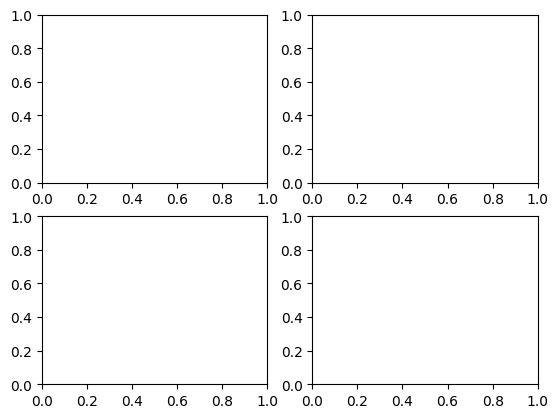

In [25]:
mushroom.display_predicted_pixels(channel='APOC1')

array([[<Axes: title={'center': 's0'}, ylabel='predicted'>,
        <Axes: title={'center': 's3'}>],
       [<Axes: ylabel='true'>, <Axes: >]], dtype=object)

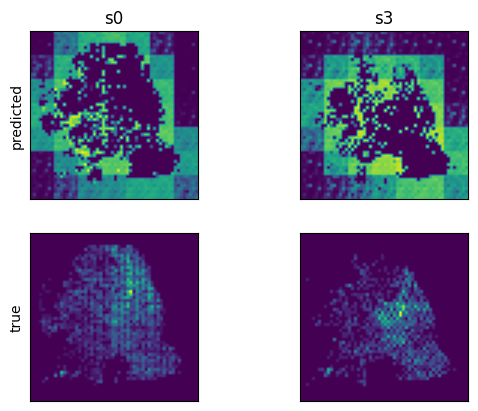

In [19]:
mushroom.display_predicted_pixels(channel='ACTA2')

In [31]:
mushroom.cluster_sections()

INFO:root:no background channel detected, defaulting to mean of all channels
/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site-packages/joblib/externals/loky/backend/context.py:136: UserWarning: Could not find the number of physical cores for the following reason:
[Errno 13] Permission denied: 'lscpu'
Returning the number of logical cores instead. You can silence this warning by setting LOKY_MAX_CPU_COUNT to the number of cores you want to use.
  warnings.warn(
  File "/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/site-packages/joblib/externals/loky/backend/context.py", line 250, in _count_physical_cores
    cpu_info = subprocess.run(
  File "/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/subprocess.py", line 505, in run
    with Popen(*popenargs, **kwargs) as process:
  File "/data/estorrs/miniconda3/envs/mushroom-dev/lib/python3.9/subprocess.py", line 951, in __init__
    self._execute_child(args, executable, preexec_fn, close_fds,
  File "/data/estor

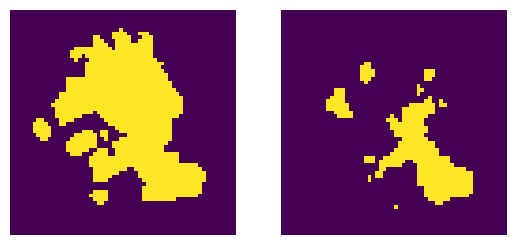

In [32]:
mushroom.clusterer.display_section_masks()

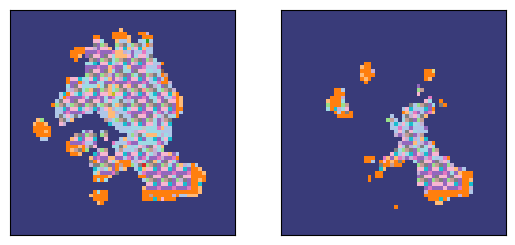

In [33]:
mushroom.clusterer.display_cluster_ids(mushroom.cluster_ids)

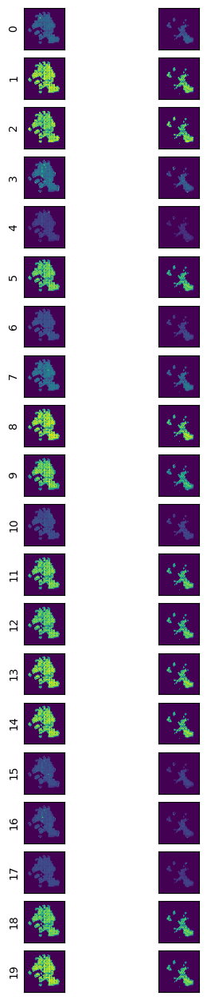

In [34]:
mushroom.clusterer.display_distances(mushroom.dists, figsize=(4, 16))

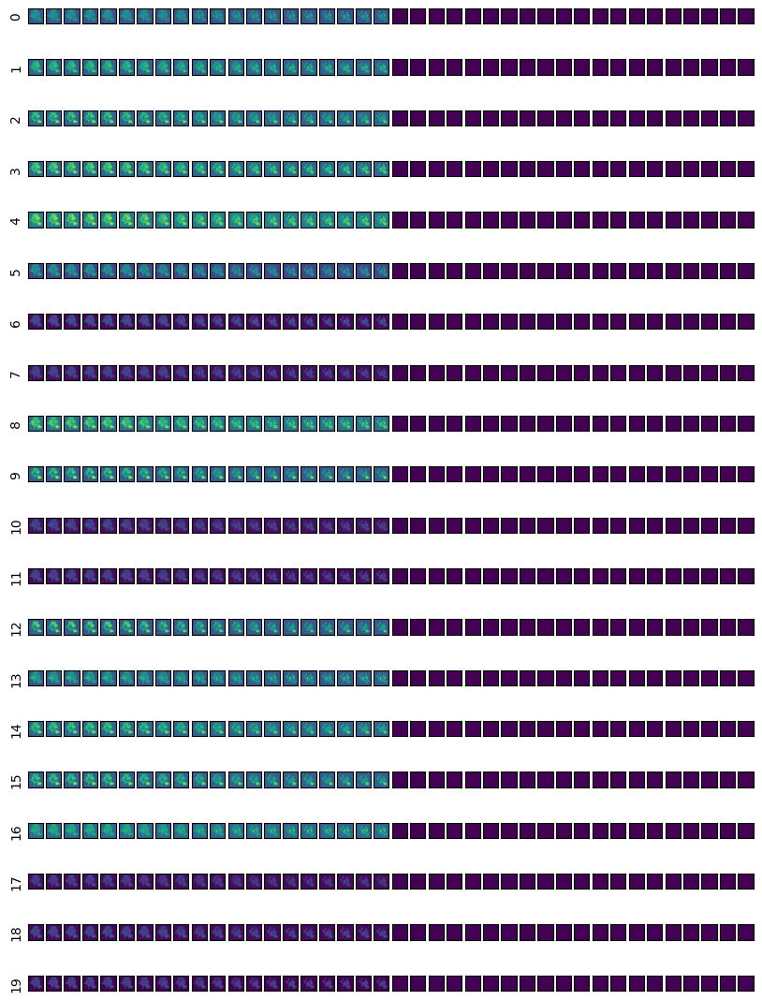

In [174]:
mushroom.clusterer.display_distances(mushroom.dists_volume, figsize=(10, 14))

In [175]:
mushroom.save_config(os.path.join(out_dir, 'config.yaml'))

In [176]:
mushroom.save_outputs(os.path.join(out_dir, 'outputs.pt'))